# Autotuning with ytopt


In [50]:
#!pip3 install shap
import sys
#!pip3 install NumPy==1.24
#!{sys.executable} -m pip install shap

import shap

In [2]:
#!pip install nest_asyncio
#!{sys.executable} -m pip install nest_asyncio
import nest_asyncio
nest_asyncio.apply()

In [3]:
import json
import os
import pathlib
import shutil

#!export TF_CPP_MIN_LOG_LEVEL=3
#!export TF_XLA_FLAGS=--tf_xla_enable_xla_devices

#!{sys.executable} -m pip install matplotlib
import matplotlib.pyplot as plt
import numpy as np
#import tensorflow as tf
from tqdm import tqdm

<div class="alert alert-info">
    
<b>Note</b>
    
The `TF_CPP_MIN_LOG_LEVEL` can be used to avoid the logging of Tensorflow *DEBUG*, *INFO* and *WARNING* statements.
    
</div>

<div class="alert alert-info">
    
<b>Note</b>
    
The following can be used to detect if **GPU** devices are available on the current host.
    
</div>

In [4]:
import math
import random
def f(config):
    val = - config["x"]**2
    if random.random() < 0.1:
        val = math.nan
    return val

In [5]:
import pandas as pd

real_data = pd.read_csv('results.csv')

In [6]:
#real_data.describe

In [7]:
print(real_data)

          p0  p1       p2  Object  elapsed_sec   Best
0   0.013631   8  rmsprop   1.167   645.364665  1.167
1   0.033102   9  rmsprop   1.170   676.761010  1.167
2   0.001000  10  rmsprop   1.152   710.387361  1.152
3   0.006524  10  rmsprop   1.152   717.645151  1.152
4   0.018886  11     adam   1.168   750.682091  1.152
5   0.059060  14     adam   1.219   852.347895  1.152
6   0.026543  15     adam   1.170   890.734087  1.152
7   0.034370  20  rmsprop   1.161  1091.371187  1.152
8   0.020057   7     adam   1.173  1127.853289  1.152
9   0.061192  25     adam   1.235  1306.341546  1.152
10  0.005218  26     adam   1.141  1349.813941  1.141
11  0.038446  32     adam   1.176  1609.643129  1.141
12  0.066068  33     adam   1.227  1652.338586  1.141
13  0.077274  34     adam   1.274  1693.859406  1.141
14  0.059612  35  rmsprop   1.179  1727.116271  1.141
15  0.030140  22     adam   1.176  1778.774282  1.141
16  0.033385  24  rmsprop   1.155  1883.420461  1.141
17  0.057081  41  rmsprop   

In [8]:
objective = 'Object'

In [9]:
print(real_data['Object'])

0     1.167
1     1.170
2     1.152
3     1.152
4     1.168
5     1.219
6     1.170
7     1.161
8     1.173
9     1.235
10    1.141
11    1.176
12    1.227
13    1.274
14    1.179
15    1.176
16    1.155
17    1.171
18    1.229
19    1.214
20    1.207
21    1.233
22    1.214
23    1.217
24    1.164
25    1.143
26    1.166
27    1.140
28    1.208
29    1.141
30    1.142
31    1.150
32    1.142
33    1.173
34    1.178
35    1.139
36    1.178
37    1.170
Name: Object, dtype: float64


In [10]:

real_data['objective'] = 1/real_data[objective]

In [11]:
#real_df = df.loc[df['objective'] < q_10]
real_df = real_data.drop(columns=['Object','elapsed_sec'])

In [12]:
real_df

,p0,p1,p2,Best,objective
0,0.013631,8,rmsprop,1.167,0.856898
1,0.033102,9,rmsprop,1.167,0.854701
2,0.001000,10,rmsprop,1.152,0.868056
3,0.006524,10,rmsprop,1.152,0.868056
4,0.018886,11,adam,1.152,0.856164
5,0.059060,14,adam,1.152,0.820345
6,0.026543,15,adam,1.152,0.854701
7,0.034370,20,rmsprop,1.152,0.861326
8,0.020057,7,adam,1.152,0.852515
9,0.061192,25,adam,1.152,0.809717


In [13]:
print('non-unique columns:')
[e for e in real_df.columns if real_df[e].nunique() != 1]

non-unique columns:


['p0', 'p1', 'p2', 'Best', 'objective']

(array([ 1.,  0.,  2.,  4.,  4.,  0.,  3., 12.,  4.,  8.]),
 array([0.78492936, 0.79423273, 0.80353611, 0.81283949, 0.82214286,
        0.83144624, 0.84074962, 0.85005299, 0.85935637, 0.86865975,
        0.87796313]),
 <BarContainer object of 10 artists>)

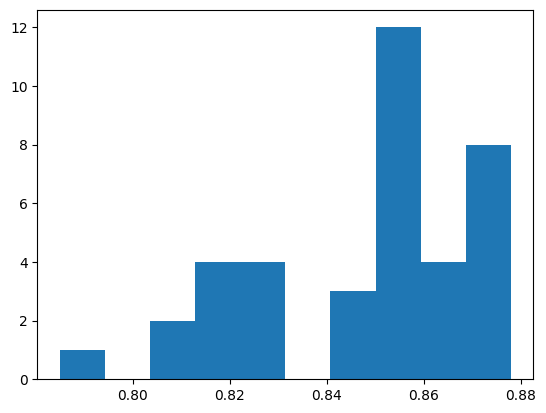

In [14]:
plt.hist(real_df.objective.values)

In [15]:
real_df_cut = real_df#[real_df.objective < 1000.00]

In [16]:
#real_df_cut

In [17]:
# determine categorical and numerical features
numerical_ix = real_df_cut.select_dtypes(include=['int64', 'float64']).columns
categorical_ix = real_df_cut.select_dtypes(include=['object', 'bool']).columns

In [18]:
print(numerical_ix)
print(categorical_ix)

Index(['p0', 'p1', 'Best', 'objective'], dtype='object')
Index(['p2'], dtype='object')


In [19]:
from sklearn.base import BaseEstimator, TransformerMixin

class IdentityTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass
    
    def fit(self, input_array, y=None):
        return self
    
    def transform(self, input_array, y=None):
        return input_array*1

In [20]:
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn import linear_model
from sklearn.metrics import r2_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,OneHotEncoder, MinMaxScaler, OrdinalEncoder
#!pip install scikit-optimize
import skopt
from sklearn.compose import ColumnTransformer
from sklearn.neighbors import KNeighborsRegressor

In [21]:
t = [('cat', OrdinalEncoder(), categorical_ix), ('num', IdentityTransformer(), numerical_ix)]
data_pipeline = ColumnTransformer(transformers=t)

In [22]:
data_pipeline_model = data_pipeline.fit(real_df_cut)

In [23]:
preprocessed_data = data_pipeline_model.transform(real_df_cut)

In [24]:
preprocessed_data.shape

(38, 5)

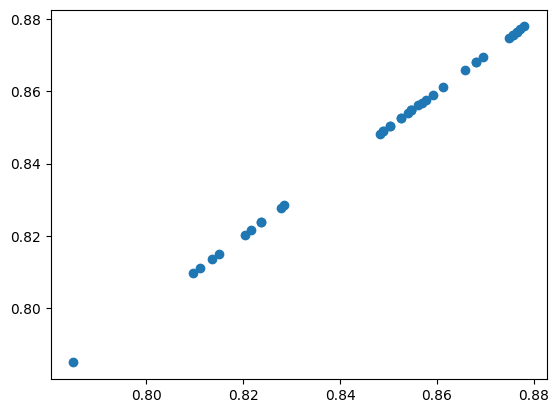

In [25]:
plt.scatter(preprocessed_data[:,4],real_df_cut['objective'].values)

In [26]:
#preprocessed_data[:,4]

In [27]:
regr = RandomForestRegressor()
#regr.fit(preprocessed_data[:,1:],preprocessed_data[:,0])

In [28]:
from sklearn.model_selection import cross_val_score

In [29]:
cv_scores = cross_val_score(regr, preprocessed_data[:,0:4],preprocessed_data[:,4], cv=10)

In [30]:
preprocessed_data.shape

(38, 5)

In [31]:
print(cv_scores)

[ 0.4563878   0.9631386   0.91829905  0.65556864  0.81701656 -5.33497151
 -0.63235357  0.97791941  0.96435495  0.95056529]


In [33]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(preprocessed_data[:,0:4], preprocessed_data[:,4], test_size=0.50, 
                                                    random_state=42)

In [34]:
X_train.shape

(19, 4)

In [35]:
regr.fit(X_train,y_train)

RandomForestRegressor()

0.8755130170491295


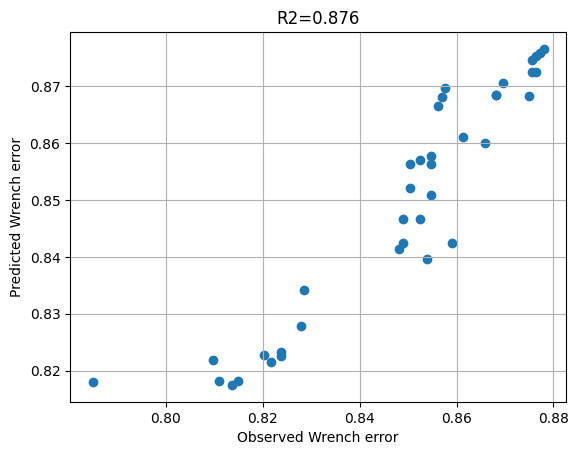

In [36]:
preds = regr.predict(preprocessed_data[:,0:4])
plt.scatter(preprocessed_data[:,4],preds)
r2 = r2_score(preprocessed_data[:,4],preds)
print(r2)
plt.ylabel('Predicted Wrench error')
plt.xlabel('Observed Wrench error')
#plt.suptitle('Wrench simulation error prediction')
plt.title('R2=%1.3f'%r2)
plt.grid()

In [37]:
input_names = real_df_cut.columns.to_list()[:-1]

In [38]:
sorted_idx = regr.feature_importances_.argsort()

In [39]:
print(sorted_idx)
print(input_names)

[3 2 0 1]
['p0', 'p1', 'p2', 'Best']


In [40]:
input_names_new = []
for inp in input_names:
    k = inp
    input_names_new.append(k)

In [41]:
input_names = input_names_new

In [42]:
import shap

In [43]:
explainer = shap.TreeExplainer(regr)
shap_values = explainer.shap_values(preprocessed_data[:,0:4])

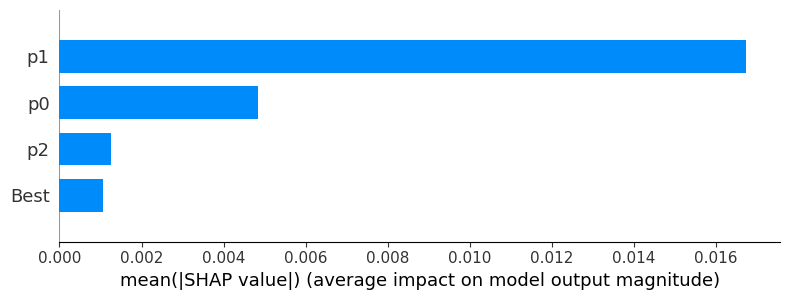

In [44]:
shap.summary_plot(shap_values, feature_names = input_names, plot_type="bar")

In [45]:
X_test1 = pd.DataFrame(preprocessed_data[:,0:4])
X_test1.columns = input_names

In [46]:
#print(X_test1)

In [47]:
import random
random_indices = random.sample(range(X_test1.shape[0]),30)

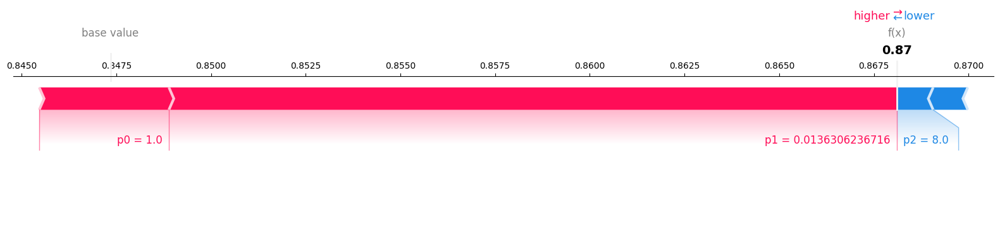

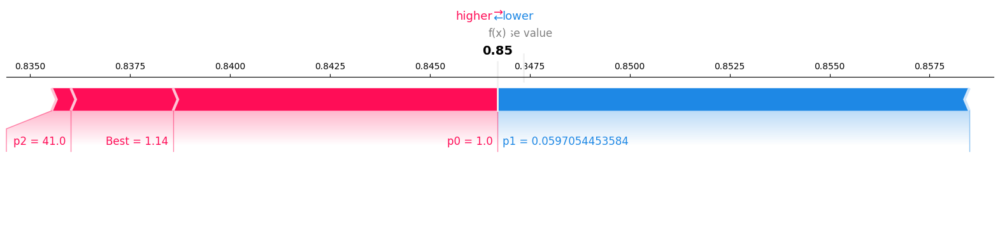

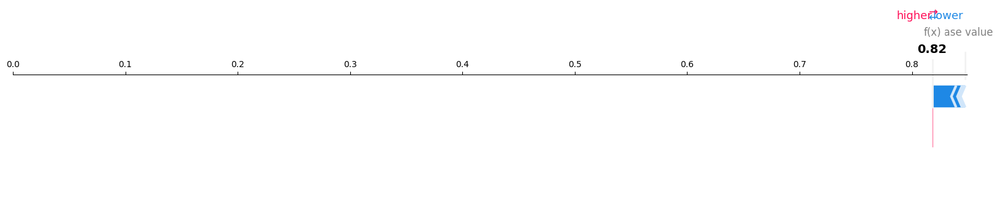

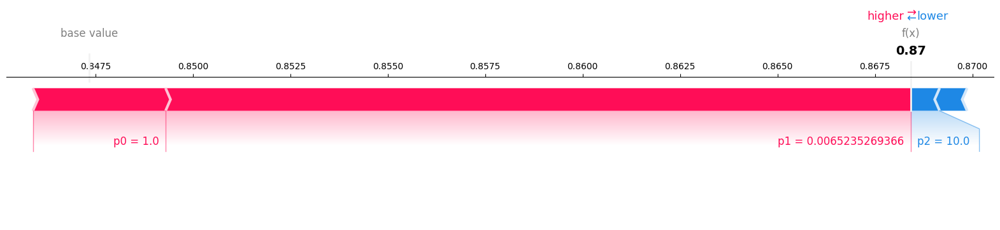

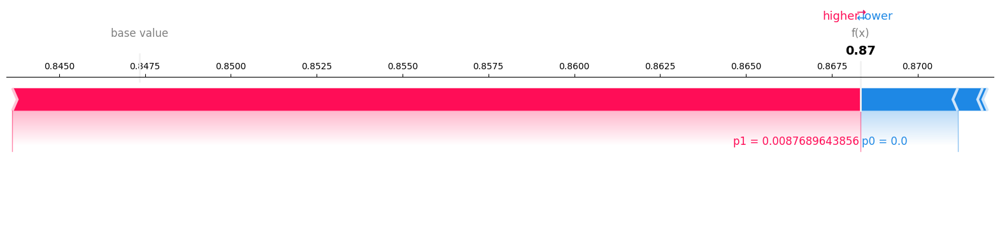

...

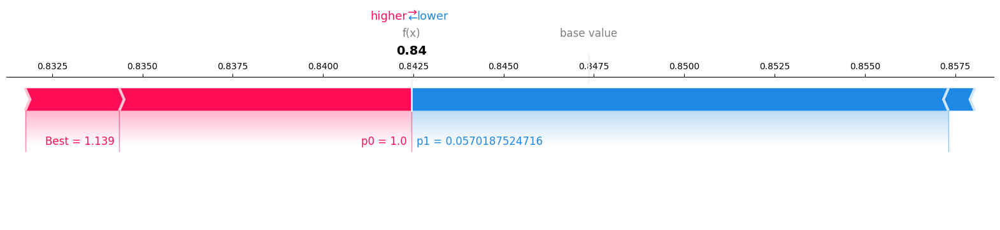

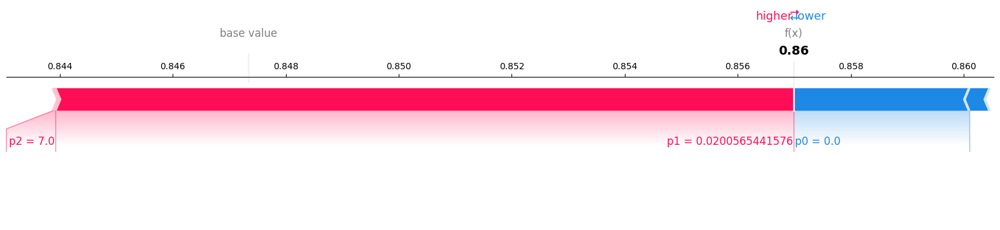

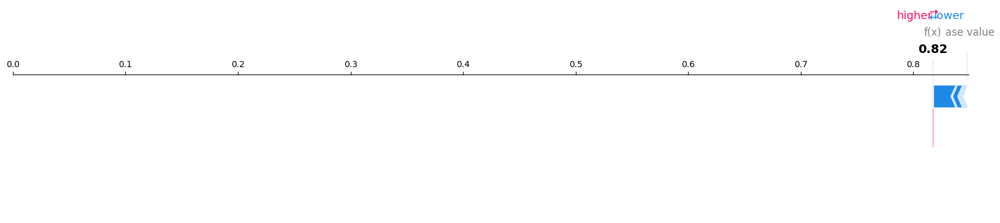

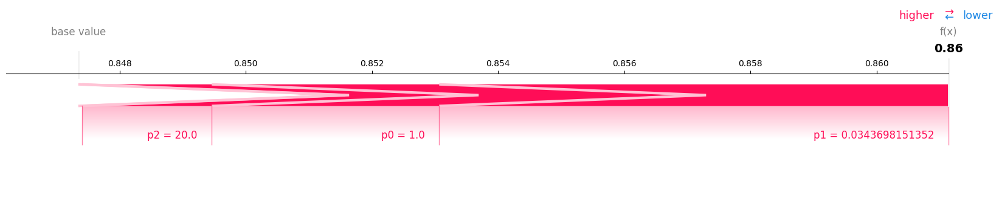

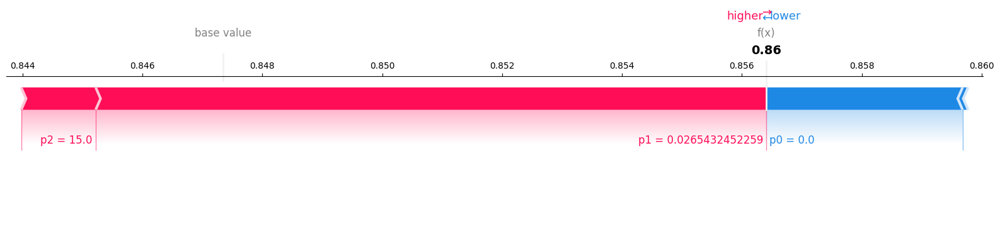

In [48]:
for i in random_indices: 
    choosen_instance = X_test1.loc[[i]]
    shap_values = explainer.shap_values(choosen_instance)
    shap.initjs()
    shap.force_plot(explainer.expected_value, shap_values, choosen_instance,matplotlib=True)